# Trackpy and Trajectory Analysis Procedures

### This notebook has two sections. The first section shows how to use Trackpy to get trajectories from a set of already background subtracted imagery. In this section we load in the images, find parameters that give us good feature identification, then locate and link the features to create the trajectories (commonly called "t1").
### The second section starts after the Trackpy trajectories are plotted (right now this is cell 87), and it revolves around analysing the trajectories obtained from a particle tracking code (Trackmate and Trackpy only, although it would not be difficult to change the syntax for UNIL). We read the files, calculate distributions, save the files, open the files again, calculate the average distributions for each speed/geometry, calculate lines of best fit then plot everything.
 

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd

import pims
import trackpy as tp
import os

import matplotlib  as mpl 
import matplotlib.pyplot as plt 

# Optionally, tweak styles.
mpl.rc('figure',  figsize=(10, 6))
mpl.rc('image', cmap='gray')
pd.options.display.max_rows=10


ModuleNotFoundError: No module named 'PyAVVideoReader'

In [63]:

# @pims.pipeline
# def gray(image):
#     return image[:, :, 1]  # Take just the green channel

datapath1='E:/Flow/Paenibacillus/GS80PL20Z20/1ulh_001_frames'#Import images
#os.chdir('C:/Users/marcb/Desktop/PT_flow_videos/')
#datapath1='C:/Users/marcb/Desktop/bgs_output_flow/802020_5ulh_002_gaussmixv2'
# datapath2='C:/Users/marcb/Downloads/bgslibrary2_qtgui_opencv320_x64/output/fg/401020_1ulh_003_gaussmixv2'
# datapath3='C:/Users/marcb/Downloads/bgslibrary2_qtgui_opencv320_x64/output/fg/402020_1ulh_002_gaussmixv2'
# datapath4='C:/Users/marcb/Downloads/bgslibrary2_qtgui_opencv320_x64/output/fg/402020_1ulh_003_gaussmixv2'
# datapath5='C:/Users/marcb/Downloads/bgslibrary2_qtgui_opencv320_x64/output/fg/802020_1ulh_002_gaussmixv2'
# datapath6='C:/Users/marcb/Downloads/bgslibrary2_qtgui_opencv320_x64/output/fg/802020_1ulh_004_gaussmixv2'
# datapath7='C:/Users/marcb/Downloads/bgslibrary2_qtgui_opencv320_x64/output/fg/802020_1ulh_005_gaussmixv2'



# datapath1_5='C:/Users/marcb/Downloads/bgslibrary2_qtgui_opencv320_x64/output/fg/401020_5ulh_002_gaussmixv2'
# datapath2_5='C:/Users/marcb/Downloads/bgslibrary2_qtgui_opencv320_x64/output/fg/401020_5ulh_003_gaussmixv2'
# datapath3_5='C:/Users/marcb/Downloads/bgslibrary2_qtgui_opencv320_x64/output/fg/402020_5ulh_002_gaussmixv2'
# datapath4_5='C:/Users/marcb/Downloads/bgslibrary2_qtgui_opencv320_x64/output/fg/802020_5ulh_002_gaussmixv2'
# datapath5_5='C:/Users/marcb/Downloads/bgslibrary2_qtgui_opencv320_x64/output/fg/802020_5ulh_003_gaussmixv2'

#prefix='corrected_image#'
#prefix='frame'
frames1 = pims.as_grey(pims.open(os.path.join(datapath1,'frame*.jpg')))
# frames2 = pims.as_grey(pims.open(os.path.join(datapath2,'*.png')))
# frames3 = pims.as_grey(pims.open(os.path.join(datapath3,'*.png')))
# frames4 = pims.as_grey(pims.open(os.path.join(datapath4,'*.png')))
# frames5 = pims.as_grey(pims.open(os.path.join(datapath5,'*.png')))
# frames6 = pims.as_grey(pims.open(os.path.join(datapath6,'*.png')))
# frames7 = pims.as_grey(pims.open(os.path.join(datapath7,'*.png')))

#frames4 = pims.as_grey(pims.open(os.path.join(datapath4, prefix + '*.jpg')))


# frames1_5 = pims.as_grey(pims.open(os.path.join(datapath1_5, '*.png')))
# frames2_5 = pims.as_grey(pims.open(os.path.join(datapath2_5,  '*.png')))
# frames3_5 = pims.as_grey(pims.open(os.path.join(datapath3_5,  '*.png')))
# frames4_5 = pims.as_grey(pims.open(os.path.join(datapath4_5,  '*.png')))
# frames5_5 = pims.as_grey(pims.open(os.path.join(datapath5_5,  '*.png')))

frames=frames1
from pims import ImageSequence
#ImageSequence(frames)


frames

(ImageSequence,) processed through proc_func. Original repr:
    <Frames>
    Source: E:\Flow\Paenibacillus\GS80PL20Z20\1ulh_001_frames\frame*.jpg
    Length: 3215 frames
    Frame Shape: (2048, 2048, 3)
    Pixel Datatype: uint8

In [154]:
result=tp.preprocessing.bandpass(frames[1],5,21)
newim=frames[1]-result

In [299]:
# Start trying to locate features by tweaking diamter, minmass, separation, mass, ecc, signal and size

#Parameters for 402020 and 401020 (may need to be tweaked a bit)
diameter=(39)
#f_locate=tp.locate_brightfield_ring(frames_invert[500],diameter)
f_locate = tp.locate(frames[0], diameter, minmass=130000, max_iterations=5, noise_size=1, separation=30, invert=False, preprocess=False, percentile=0)
f_locate_filtered= f_locate[((f_locate['ecc']<.02)&(f_locate['signal']<240)&(f_locate['mass']>130000)&(f_locate['signal']>150))]

#Parameters for 802020
#diameter=39
#f_locate = tp.locate(frames3[500], diameter, minmass=300, max_iterations=3, noise_size=3, separation=34, invert=False)
#f_locate_filtered= f_locate[((f_locate['ecc']<.5)&(f_locate['signal']>1.6))]
#f_locate_blank= f_locate[((f_locate['ecc']<.001)&(f_locate['mass']>600000))]
f_locate_filtered


,y,x,mass,size,ecc,signal,raw_mass,ep,frame
88,212.979910,512.028210,150126.0,13.404845,0.009135,153.0,151189.0,NaN,0
108,260.032547,257.947903,153040.0,13.427502,0.010434,166.0,154104.0,NaN,0
114,266.986803,316.114047,151701.0,13.434313,0.006726,160.0,152723.0,NaN,0
115,276.924406,519.094591,152657.0,13.394315,0.013266,153.0,153683.0,NaN,0
150,323.919885,253.894707,152043.0,13.410629,0.005876,152.0,153115.0,NaN,0
...,...,...,...,...,...,...,...,...,...
854,1993.095659,1601.088941,149144.0,13.388952,0.003847,165.0,150108.0,NaN,0
859,1999.072344,1858.881187,148872.0,13.414779,0.009197,190.0,149883.0,NaN,0
864,2017.963856,339.890857,154852.0,13.410676,0.004157,160.0,155880.0,NaN,0
869,2023.937093,1037.143764,151923.0,13.413864,0.005340,150.0,152976.0,NaN,0


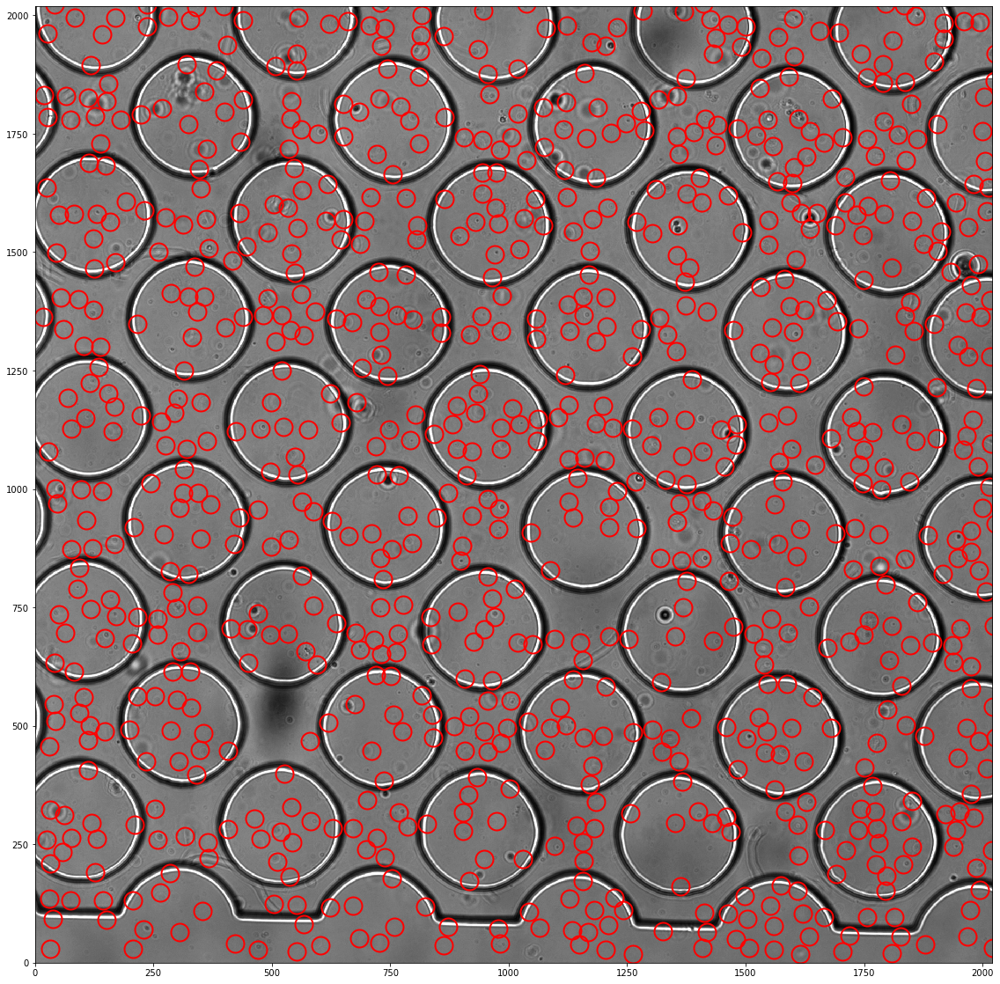

<Figure size 1440x1440 with 0 Axes>

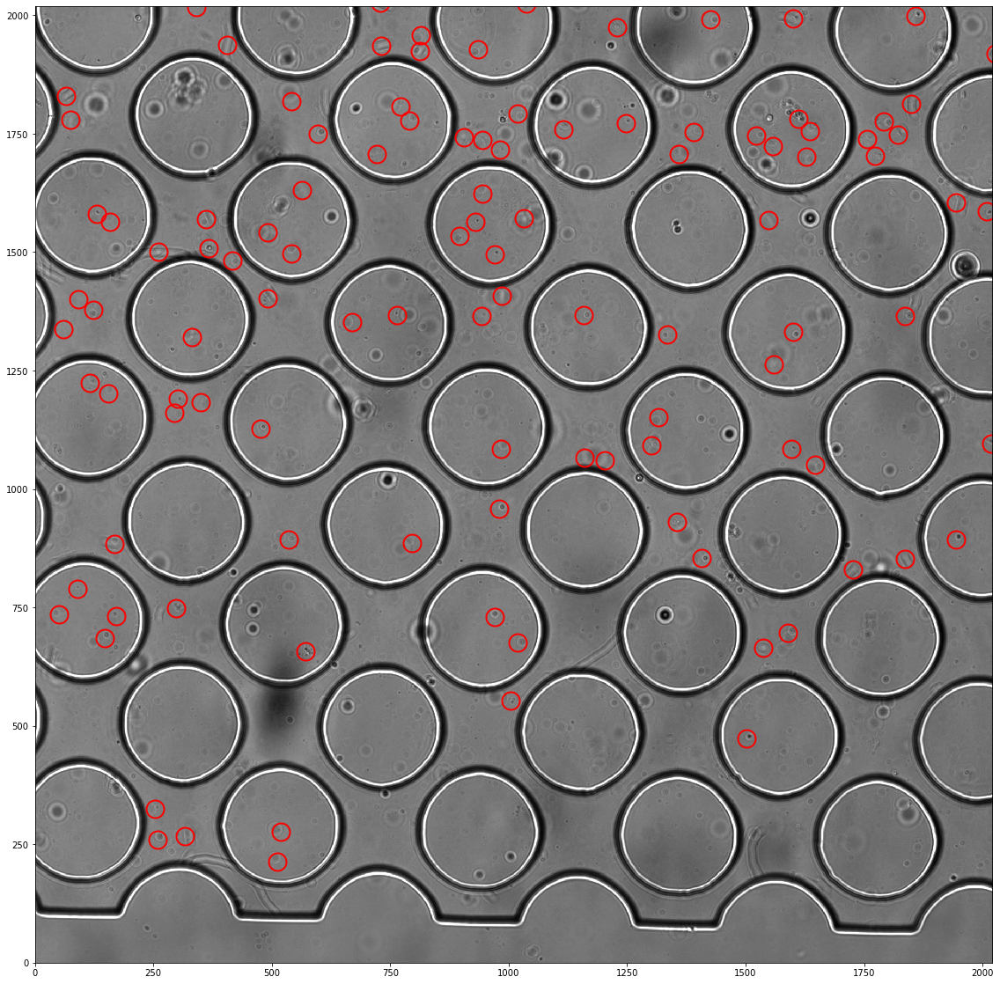

In [300]:
#Zoom in to assess accuraccy of feature location

plt.figure(figsize=(20,20))
tp.annotate(f_locate, frames[0], plot_style={'markersize': (20)}, ax=plt.gca())
plt.ylim(0, 2020)
plt.xlim(0, 2020);
plt.figure(figsize=(20,20))

plt.figure(figsize=(20,20))
tp.annotate(f_locate_filtered, frames[0], plot_style={'markersize': (20)}, ax=plt.gca())
plt.ylim(0, 2020)
plt.xlim(0, 2020);

In [301]:
#Store all features in each frame in a dataframe called f
#f = tp.locate(frames[0], diameter, invert=False, separation=50, minmass=1000, noise_size=0, preprocess=False)
#f_locate = tp.locate(frames[0], diameter, minmass=0, max_iterations=1, noise_size=2, separation=16, invert=False)
#f_locate = tp.locate(frames[500], diameter, minmass=3000, max_iterations=1, noise_size=3, separation=8, invert=False)
#f_locate = tp.locate(frames[500], diameter, minmass=150, max_iterations=1, noise_size=1, separation=10, invert=False)

#tp.quiet()
diameter=39
#f = tp.batch(frames, diameter, minmass=400, max_iterations=3, noise_size=4, separation=20, invert=False)
f1 = tp.batch(frames, diameter, minmass=130000, max_iterations=5, noise_size=1, separation=30, invert=False, preprocess=False, percentile=0)
# f2 = tp.batch(frames2, diameter, minmass=1000, max_iterations=2, noise_size=2, separation=30, invert=False)
# f3 = tp.batch(frames3, diameter, minmass=1000, max_iterations=2, noise_size=2, separation=30, invert=False)
# f4 = tp.batch(frames4, diameter, minmass=1000, max_iterations=2, noise_size=2, separation=30, invert=False)
# f5 = tp.batch(frames5, diameter, minmass=1000, max_iterations=2, noise_size=2, separation=30, invert=False)
# f6 = tp.batch(frames6, diameter, minmass=1000, max_iterations=2, noise_size=2, separation=30, invert=False)
# f7 = tp.batch(frames7, diameter, minmass=1000, max_iterations=2, noise_size=2, separation=30, invert=False)

# #f4 = tp.batch(frames4, diameter, minmass=300, max_iterations=3, noise_size=3, separation=32, invert=False)
# print ('done with 1ul/h')
# f1_5 = tp.batch(frames1_5, diameter, minmass=1000, max_iterations=2, noise_size=2, separation=30, invert=False)
# f2_5 = tp.batch(frames2_5, diameter, minmass=1000, max_iterations=2, noise_size=2, separation=30, invert=False)
# f3_5 = tp.batch(frames3_5, diameter, minmass=1000, max_iterations=2, noise_size=2, separation=30, invert=False)
# f4_5 = tp.batch(frames4_5, diameter, minmass=1000, max_iterations=2, noise_size=2, separation=30, invert=False)
# f5_5 = tp.batch(frames5_5, diameter, minmass=1000, max_iterations=2, noise_size=2, separation=30, invert=False)

# #f = tp.batch(frames, diameter, minmass=150, max_iterations=3, noise_size=3, separation=24, invert=True)



Frame 3214: 901 features


In [317]:
#More filtering
#f1= f[((f['mass'] < 60000)&(f['ecc']<.7)&(f['signal']<10000)&(f['signal']>10)&(f['size']<3.5)&(f['size']>0))]

#f1=f[((f['signal']>1.3)&(f['ecc']<.3))]
f2= f1[((f1['ecc']<.02)&(f1['signal']<240)&(f1['mass']>130000)&(f1['signal']>140))]

#f2=f1[((f1['signal']<100)&(f1['ecc']<.95)&(f1['ecc']>.05))]
# f2=f2[((f2['signal']>.5)&(f2['ecc']<.75))]
# f3=f3[((f3['signal']>.5)&(f3['ecc']<.75))]
# f4=f4[((f4['signal']>.5)&(f4['ecc']<.75))]
# f5=f5[((f5['signal']>.5)&(f5['ecc']<.75))]
# f6=f6[((f6['signal']>.5)&(f6['ecc']<.75))]
# f7=f7[((f7['signal']>.5)&(f7['ecc']<.75))]

# # f4=f4[((f4['signal']>1.9)&(f4['ecc']<.25))]

# f1_5=f1_5[((f1_5['signal']>.5)&(f1_5['ecc']<.75))]
# f2_5=f2_5[((f2_5['signal']>.5)&(f2_5['ecc']<.75))]
# f3_5=f3_5[((f3_5['signal']>.5)&(f3_5['ecc']<.75))]
# f4_5=f4_5[((f4_5['signal']>.5)&(f4_5['ecc']<.75))]
# f5_5=f5_5[((f5_5['signal']>.5)&(f5_5['ecc']<.75))]


#f1[f1.signal>50]
f1

,y,x,mass,size,ecc,signal,raw_mass,ep,frame
0,19.011218,1263.052789,137547.0,13.397827,0.001309,127.0,138315.0,NaN,0
1,18.979200,1614.988512,137358.0,13.355188,0.004656,144.0,138207.0,NaN,0
2,19.972475,1808.017874,139256.0,13.391574,0.003356,129.0,139978.0,NaN,0
3,22.979209,553.017481,144389.0,13.397560,0.002427,133.0,145496.0,NaN,0
4,24.023009,1704.055361,134950.0,13.396067,0.001973,126.0,135891.0,NaN,0
...,...,...,...,...,...,...,...,...,...
2904582,2020.988509,1833.256165,146726.0,13.358096,0.008557,149.0,147736.0,NaN,3214
2904583,2022.959566,1794.928575,141491.0,13.324597,0.022628,149.0,142421.0,NaN,3214
2904584,2024.018450,40.915594,151114.0,13.402102,0.007323,147.0,152194.0,NaN,3214
2904585,2025.107451,237.334225,156676.0,12.855979,0.065471,255.0,157564.0,NaN,3214


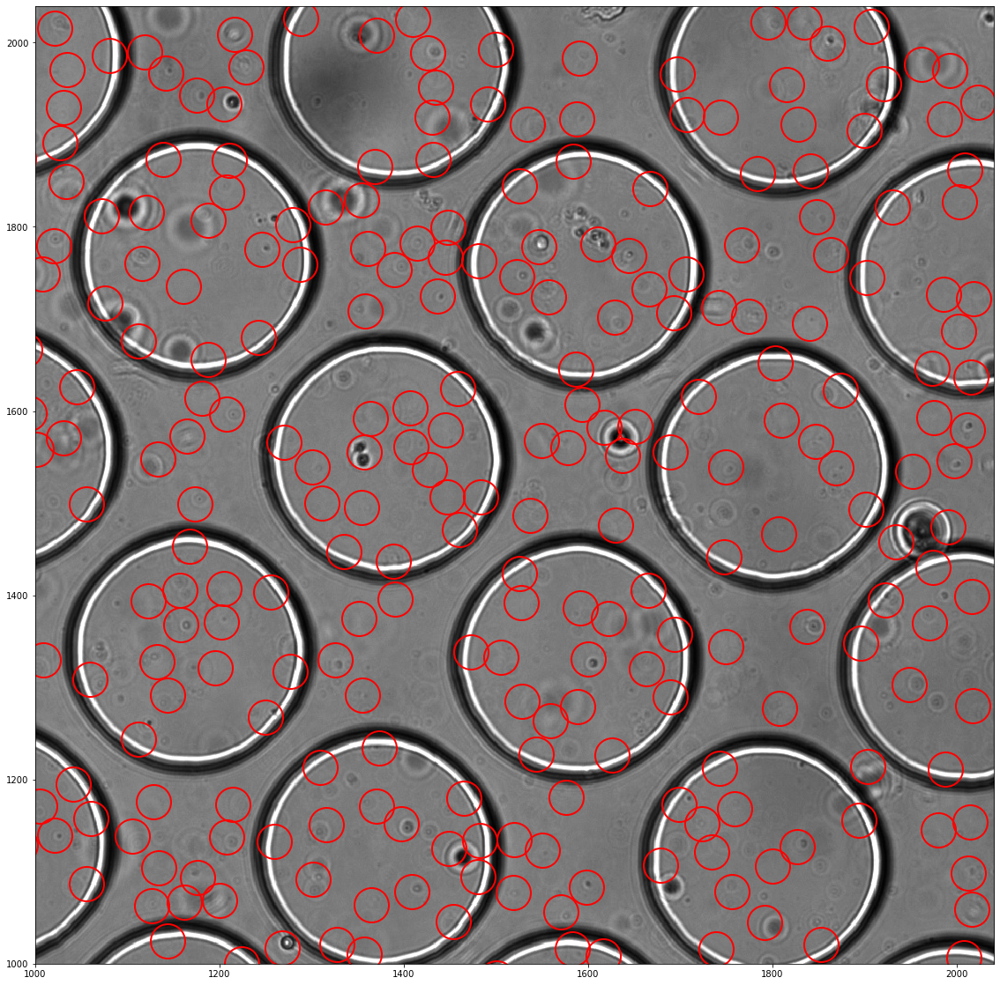

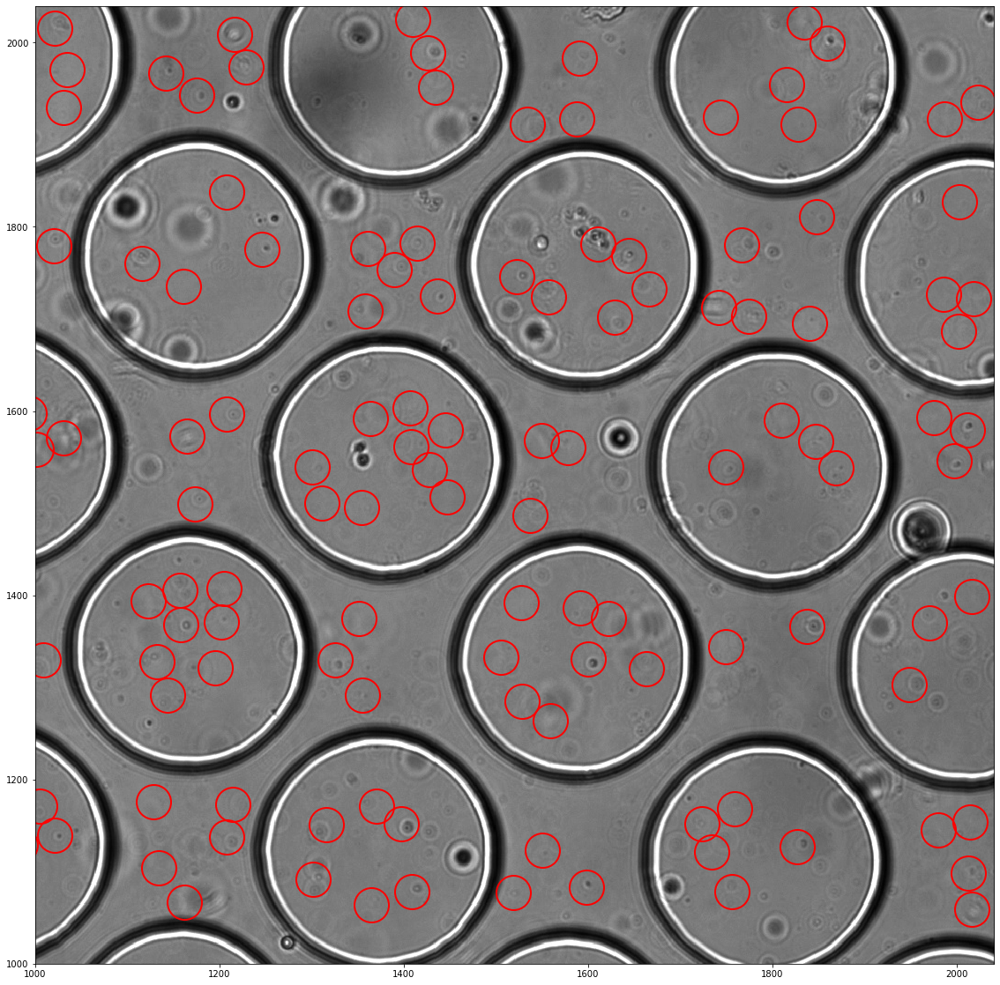

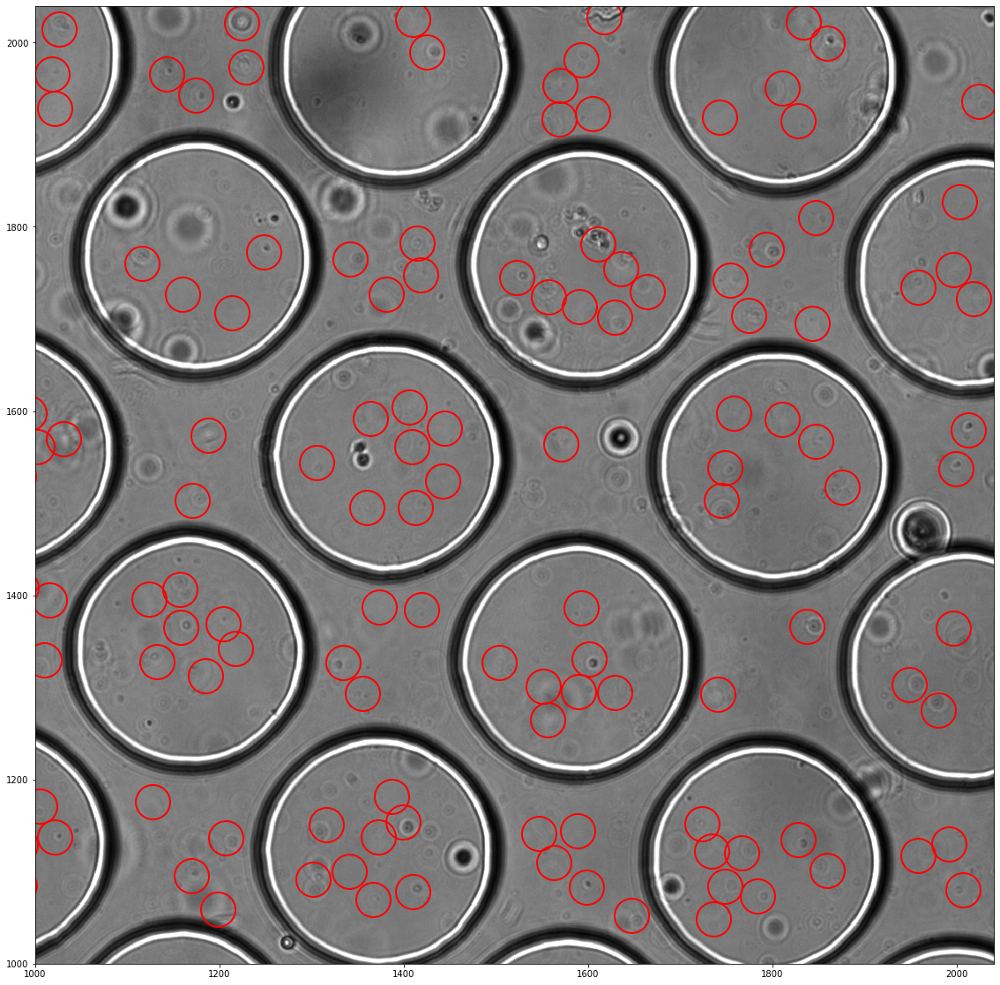

In [316]:
plt.figure(figsize=(20,20))
tp.annotate(f1[f1.frame==400], frames[400], plot_style={'markersize': (diameter)}, ax=plt.gca())
plt.ylim(1000, 2040)
plt.xlim(1000, 2040);

plt.figure(figsize=(20,20))
tp.annotate(f2[f2.frame==400], frames[400], plot_style={'markersize': (diameter)}, ax=plt.gca())
plt.ylim(1000, 2040)
plt.xlim(1000, 2040);

plt.figure(figsize=(20,20))
tp.annotate(f2[f2.frame==408], frames[408], plot_style={'markersize': (diameter)}, ax=plt.gca())
plt.ylim(1000, 2040)
plt.xlim(1000, 2040);

In [85]:
#Link all features into a dataframe of trajectories (df, search-radius, #of frames to keep track of particle if lost)

#t = tp.link(f1, 4.7, memory=10)
t = tp.link(f1, 40, memory=4, adaptive_stop=20,adaptive_step=.9)

Frame 2506: 118 trajectories present.


In [318]:
#This is a slightly different linking method that uses nearby particle velocities to predict a location in the next frame
#There is very little difference between the results of the different linking methods

pred = tp.predict.NearestVelocityPredict()
tr1 = pred.link_df(f2, 10, memory=5, adaptive_stop=1,adaptive_step=.9)
# tr2 = pred.link_df(f2, 40, memory=4, adaptive_stop=10,adaptive_step=.9)
# tr3 = pred.link_df(f3, 40, memory=4, adaptive_stop=10,adaptive_step=.9)
# tr4 = pred.link_df(f4, 40, memory=4, adaptive_stop=10,adaptive_step=.9)
# tr5 = pred.link_df(f5, 40, memory=4, adaptive_stop=10,adaptive_step=.9)
# tr6 = pred.link_df(f6, 40, memory=4, adaptive_stop=10,adaptive_step=.9)
# tr7 = pred.link_df(f7, 40, memory=4, adaptive_stop=10,adaptive_step=.9)

# #tr4 = pred.link_df(f4, 30, memory=4, adaptive_stop=10,adaptive_step=.9)

# print ('done with 1ul/h')
# tr1_5 = pred.link_df(f1_5, 60, memory=4, adaptive_stop=10,adaptive_step=.9)
# tr2_5 = pred.link_df(f2_5, 60, memory=4, adaptive_stop=10,adaptive_step=.9)
# tr3_5 = pred.link_df(f3_5, 60, memory=4, adaptive_stop=10,adaptive_step=.9)
# tr4_5 = pred.link_df(f4_5, 60, memory=4, adaptive_stop=10,adaptive_step=.9)
# tr5_5 = pred.link_df(f5_5, 60, memory=4, adaptive_stop=10,adaptive_step=.9)


Frame 3214: 333 trajectories present.


In [319]:
#Filter based on number of frames the particle is present for

t1 = tp.filter_stubs(tr1, 4)
# t2 = tp.filter_stubs(tr2, 10)
# t3 = tp.filter_stubs(tr3, 10)
# t4 = tp.filter_stubs(tr4, 10)
# t5 = tp.filter_stubs(tr5, 10)
# t6 = tp.filter_stubs(tr6, 10)
# t7 = tp.filter_stubs(tr7, 10)

# #t4 = tp.filter_stubs(tr4, 100)

# t1_5 = tp.filter_stubs(tr1_5, 10)
# t2_5 = tp.filter_stubs(tr2_5, 10)
# t3_5 = tp.filter_stubs(tr3_5, 10)
# t4_5 = tp.filter_stubs(tr4_5, 10)
# t5_5 = tp.filter_stubs(tr5_5, 10)


# Compare the number of particles in the unfiltered and filtered data.
print('Before:', tr1['particle'].nunique())
print('After:', t1['particle'].nunique())

Before: 132679
After: 32790


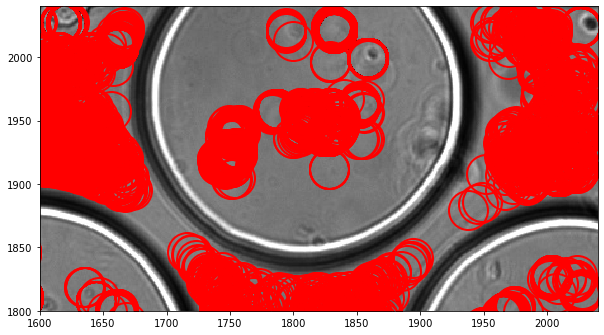

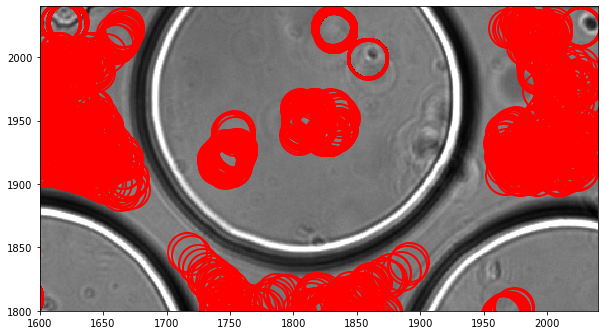

In [320]:
#Plotting difference between all trajectories and filtered trajectories

plt.figure()
tp.annotate(tr1, frames[100], plot_style={'markersize': (diameter)}, ax=plt.gca())
plt.ylim(1800, 2040)
plt.xlim(1600, 2040);
plt.figure()
tp.annotate(t1, frames[100], plot_style={'markersize': (diameter)}, ax=plt.gca())
plt.ylim(1800, 2040)
plt.xlim(1600, 2040);

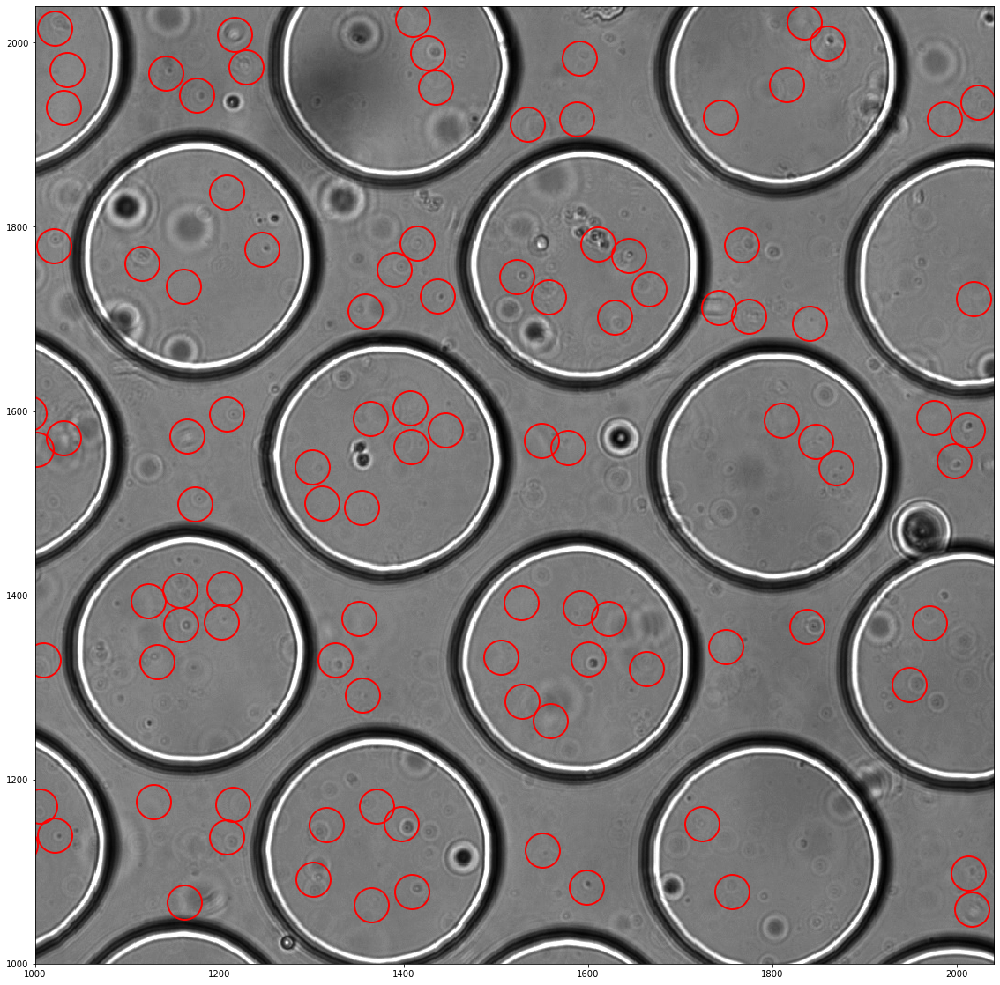

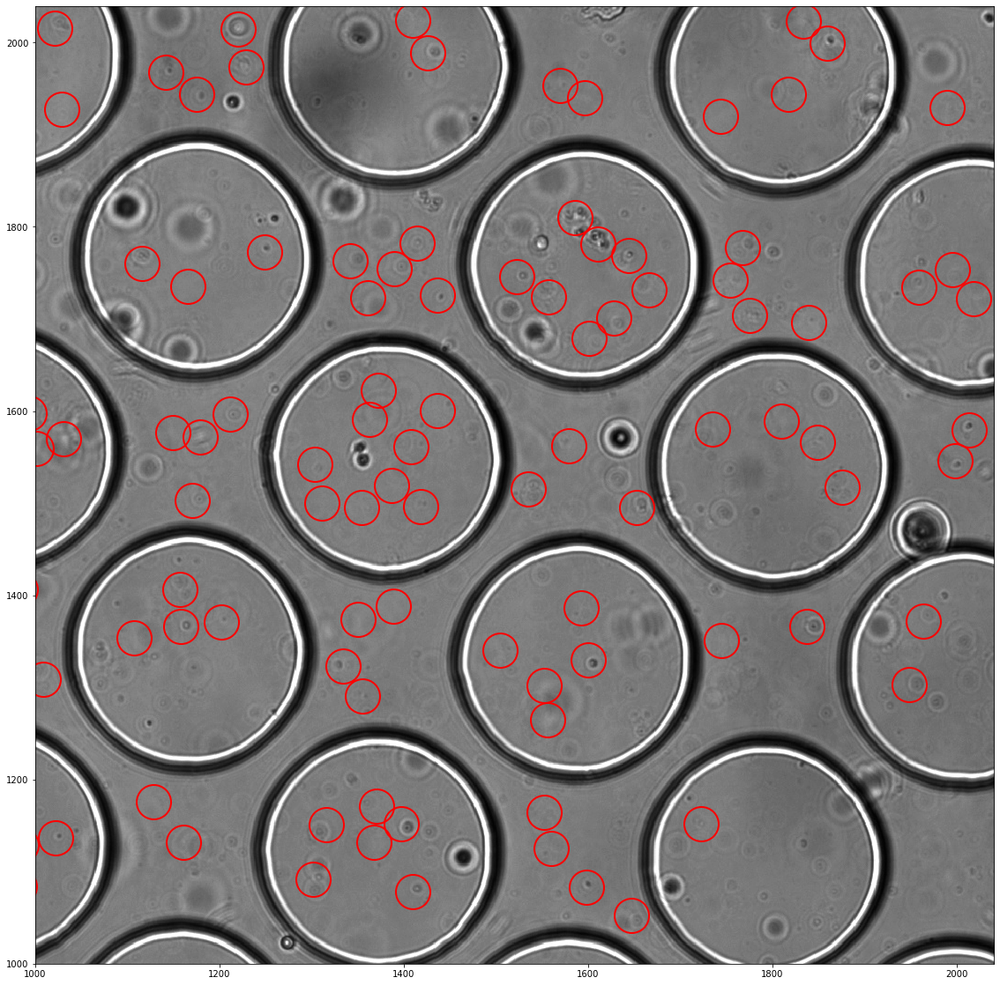

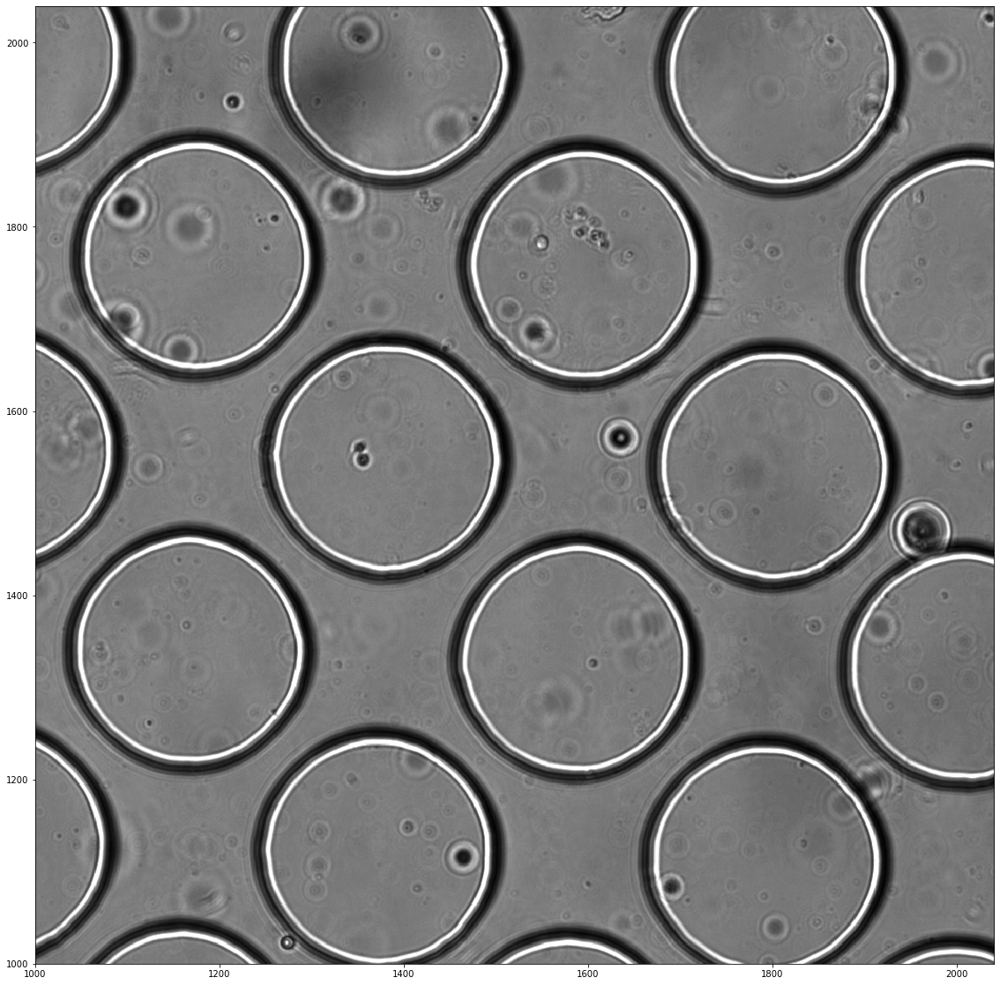

In [322]:
plt.figure(figsize=(20,20))
tp.annotate(t1[t1.frame==400], frames[400], plot_style={'markersize': (diameter)}, ax=plt.gca())
plt.ylim(1000, 2040)
plt.xlim(1000, 2040);

plt.figure(figsize=(20,20))
tp.annotate(t1[t1.frame==405], frames[405], plot_style={'markersize': (diameter)}, ax=plt.gca())
plt.ylim(1000, 2040)
plt.xlim(1000, 2040);

plt.figure(figsize=(20,20))
tp.annotate(t1[(t1.frame==400)&(t1['mass']<4000)], frames[400], plot_style={'markersize': (diameter)}, ax=plt.gca())
plt.ylim(1000, 2040)
plt.xlim(1000, 2040);


In [323]:
t1

,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
frame,,,,,,,,,,
0,18.979200,1614.988512,137358.0,13.355188,0.004656,144.0,138207.0,NaN,0,0
0,36.944100,602.030174,148176.0,13.393234,0.002997,142.0,149297.0,NaN,0,2
0,70.002270,229.984380,138793.0,13.435578,0.010106,145.0,139578.0,NaN,0,3
0,148.120447,264.990391,150797.0,13.390880,0.004767,143.0,151915.0,NaN,0,4
0,201.000337,1986.964280,139445.0,13.419606,0.002340,140.0,140287.0,NaN,0,5
...,...,...,...,...,...,...,...,...,...,...
3214,2014.896419,1026.138633,151118.0,13.451142,0.003497,150.0,152147.0,NaN,3214,131191
3214,2016.035756,943.989994,144619.0,13.412170,0.011634,147.0,145630.0,NaN,3214,111716
3214,2018.959901,339.899827,155091.0,13.414910,0.003939,157.0,156094.0,NaN,3214,119798


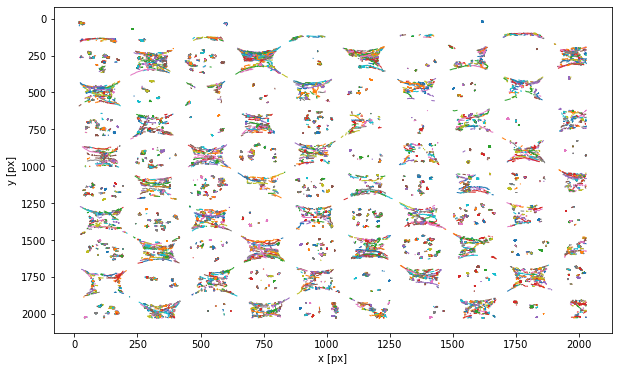

In [321]:
#Trackpy style trajectory plot
#The less restrictive we are in our tracking parameters, the more likely we are to get good trajectories,
#but we need to figure out how to remove the trajectories in the grain spaces
plt.figure()
#plt.ylim(1800, 2040)
#plt.xlim(1600, 2040)
tp.plot_traj(t1);


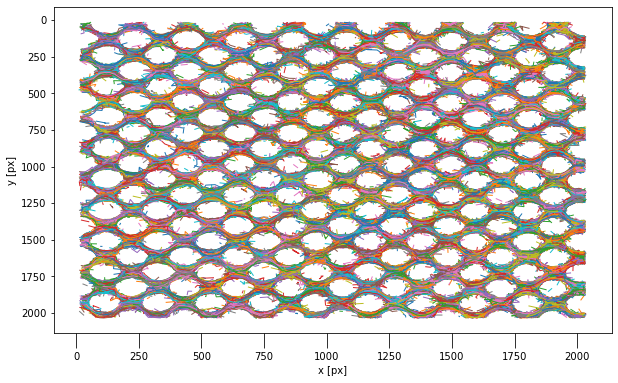

In [154]:
plt.figure()
#plt.ylim(1800, 2040)
#plt.xlim(1600, 2040)
tp.plot_traj(t2);

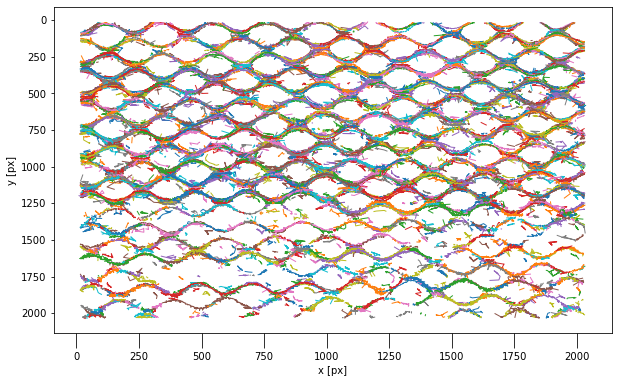

In [155]:
plt.figure()
#plt.ylim(1800, 2040)
#plt.xlim(1600, 2040)
tp.plot_traj(t3);

In [24]:
#Load in Trackmate "tracks" files

tmate=pd.read_csv('C:/Users/marcb/Desktop/trackmate_bgs/new_trajectories/bgslib_802020_5ulh_002_gaussmixv2_v2.csv', header=None)
tmate.drop(range(4),inplace=True)
tmate.drop(range(2),axis=1,inplace=True)
tmate.drop(range(3,4),axis=1, inplace=True)
tmate.drop(range(6,8),axis=1, inplace=True)
tmate.drop(range(9,20),axis=1, inplace=True)
#tmate.drop(range(9,30),axis=1, inplace=True)

tmate.columns=['particle','x','y','frame']
tmate=tmate.astype(float)
#tmate.frame=tmate.frame+400
tmate

,particle,x,y,frame
4,0.0,1984.111864,480.245389,11.0
5,0.0,1967.502086,477.085852,10.0
6,0.0,1935.110324,462.927262,8.0
7,0.0,1917.417342,444.568331,7.0
8,0.0,2001.639701,479.271397,12.0
...,...,...,...,...
13542,3094.0,678.777469,1497.768740,2908.0
13543,3094.0,675.661384,1502.595029,2907.0
13544,3094.0,692.791003,1476.812779,2910.0
13545,3094.0,669.740767,1504.498989,2906.0


In [25]:
#Load in the time file

t1.to_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/traj_003_5ulh.csv')
#t1_copy=t1.copy(deep=True)
t1=tmate
#t1=t5_5
time=pd.read_excel('E:\Flow\Paenibacillus\GS80PL20Z20\FR_5ulh_20X_25fps_1x1y_5min_002.xlsx')
time2=time.drop(range(405))
time2.index=range(len(time2))

traj_times=[]
#dist_array[0].index
#for i in range(len(dist_array)):
#    traj_times.append(time2['Time [s]'][dist_array[i].index])
#unique_part
ind=np.max(t1.frame)
if np.max(time2.Index)-1 < ind:
    t1=t1[t1.frame<np.max(time2.Index)]
t1
#t1.to_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs/traj_002_5ulh.csv')
time2
#t1.x[t1.particle==3]
# print (unique_part)
# plt.scatter(t1.x[t1.particle==15],t1.y[t1.particle==15])


,Unnamed: 0,Time [s],Index
0,NaN,0.00,1.0
1,NaN,0.08,2.0
2,NaN,0.16,3.0
3,NaN,0.24,4.0
4,NaN,0.32,5.0
...,...,...,...
3364,NaN,335.52,3365.0
3365,NaN,335.63,3366.0
3366,NaN,335.77,3367.0
3367,NaN,335.88,3368.0


In [29]:
t2=t1.copy(deep=True)

In [79]:
#Calculate velocities and angles (syntax is slightly different for Trackpy and Trackmate, so you will need to change a couple lines accordingly)
#t1=tmate
import statsmodels.api as sm
frame_list=[]
velocity_array=[]
C=[]
unique_part=[]
for i in t1.particle.unique():
    unique_part.append(i)
unique_part = [x for x in unique_part if str(x) != 'nan']

traj_stats=[]
dist=[]
count=0
for n in range(len(unique_part)):
    #print (n)
    #count=count+1
    tslice=t1.particle==unique_part[n]
    #if len(t1[tslice>3]):
            
    #--------Slight change for Trackmate----------------------------------------
#     traj_x=t1[tslice].sort_values(['frame']).x
#     traj_y=t1[tslice].sort_values(['frame']).y
#     frame=t1[tslice].sort_values(['frame']).frame
    #print (frame)
    #---------------------------------------------------------------------------
    #--------Syntax for Trackpy-------------------------------------------------
    traj_x=t1.x[tslice]
    traj_y=t1.y[tslice]
    frame=t1.frame[tslice]

    #---------------------------------------------------------------------------
    frame_diff=frame.diff()
    #time_n=time2['Time [s]'][frame].diff()
    #time_frame=time2['Time [s]'][frame]
    #mean_dt=np.mean(time_n)
    #particle=np.full_like(frame,n)
    x_diff=traj_x.diff()
    y_diff=traj_y.diff()
    vel_dist=np.sqrt(x_diff**2+y_diff**2)
    displacement=np.sqrt((traj_x.iloc[0]-traj_x.iloc[-1])**2+(traj_y.iloc[0]-traj_y.iloc[-1])**2)
    #dist=vel_dist/frame_diff
    #----------Reindex for Trackmate (also fine to use with Trackpy)-------------
    vel_dist.index=frame_diff.index
    #vel_dist.index=time_n.index
    #----------------------------------------------------------------------------
    velocity=vel_dist/frame_diff
    #velocity=vel_dist/time_n
    #C.append(sm.tsa.acf(velocity.iloc[1:],nlags=10))
    #mean_velocity=np.mean(dist)/mean_dt
    #k=x_diff.index
    velocity_array.append(velocity) 
    angles=np.zeros((len(x_diff),1))
    for i in range(len(x_diff)-1):
        #theta_1=np.arctan2(y_diff.iloc[i],x_diff.iloc[i])
        #theta_2=np.arctan2(x_diff.iloc[i+1],y_diff.iloc[i+1])
        #if i>1:
            #dframe=frame.values[i]-frame.values[i-1]
            #dist.values[i]=dist.values[i]/dframe
        theta_3=np.arctan(y_diff.iloc[i]/x_diff.iloc[i])
        theta_4=np.arctan(y_diff.iloc[i+1]/x_diff.iloc[i+1])
        #if x_diff.iloc[i+1]*x_diff.iloc[i]<0:
         #   angles[i]=360-(np.arctan2(x_diff.iloc[i],y_diff.iloc[i])+theta_2)*(180/np.pi)
        #else:
        angles[i]=(theta_4-theta_3)*(180/np.pi)

    traj_stats.append([n, angles])

In [67]:
#Plot particle velocities (very ugly compared to Trackmate)
# for i in range(len(traj_stats)):
#     plt.scatter(traj_stats[i][3], traj_stats[i][4],c=traj_stats[i][2], cmap='YlOrRd', s=1,vmin=0,vmax=250)
# c=plt.colorbar()
# plt.title('Trajectory Velocities')
# np.shape(traj_stats)
# np.nanmean(micron_velocity)
traj_y
frame_diff
velocity_array

[frame
 0          NaN
 1    18.559768
 2    29.914625
 3    18.483743
 4    24.594860
 5    34.200998
 dtype: float64,
 frame
 0            NaN
 1       6.993972
 2       8.860950
 3      22.217970
 4       7.866877
          ...    
 111    44.459446
 112    40.174083
 113    29.080035
 114    30.220232
 115    40.752226
 Length: 116, dtype: float64,
 frame
 0           NaN
 5      4.470262
 7     23.023597
 8     16.264759
 9     16.983319
 11    15.199325
 13    17.114596
 14    19.878060
 15    17.874078
 dtype: float64,
 frame
 0           NaN
 1     30.273281
 2     17.051414
 3     15.798035
 4     15.209720
         ...    
 6     29.093185
 7     32.893298
 8     42.725400
 9     37.356928
 10    26.368453
 Length: 11, dtype: float64,
 frame
 0           NaN
 1      2.881919
 3     35.130535
 5     23.337128
 7     17.782706
         ...    
 10    12.009622
 11     8.420409
 12     5.643344
 13     9.892485
 14    12.619701
 Length: 12, dtype: float64,
 frame
 0           Na

In [80]:
#Reshape arrays so we can calculate the pdf
# dist_array=[]
# for i in range(len(traj_stats)):
#     dist_array.append(traj_stats[i][0])    
# dist_array=np.array(dist_array,dtype='object')

# new_dist_array=[]
# for i in dist_array:
#     section=np.array(i[1:])
#     new_dist_array=np.hstack([section,new_dist_array])

new_velocity_array=[]
for i in velocity_array:
    section=np.array(i[:])
    new_velocity_array=np.hstack([section,new_velocity_array])

    
angle_array=[]
for i in range(len(traj_stats)):
    section=traj_stats[i][1]
    section=np.reshape(section,(len(section),))
    angle_array=np.hstack([section,angle_array])
    
#time_array=[]
#time_diff=time2['Time [s]'].diff()
#for j in range(len(dist_array)):
#    for i in dist_array[j].index[1:]:
#        frame_time=time_diff[i]
#        time_array=np.hstack([frame_time,time_array])
        
#micron_dist_array=new_dist_array*.35
#velocity=new_dist_array/time_array
micron_velocity=new_velocity_array*.325
#paen_8020_1ulh_vel_notforward=micron_velocity[~np.isnan(micron_velocity)]
#paen_8020_1ulh_ang_notforward=angle_array[~np.isnan(angle_array)]


In [81]:
#Save results
pd.DataFrame(micron_velocity).to_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs_new/vel_002_5ulh_v2.csv')
# pd.DataFrame(micron_dist_array).to_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/dist_001_5ulh.csv')
pd.DataFrame(angle_array).to_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs_new/angle_802020_5ulh_002_new.csv')
# np.mean(pd.DataFrame(C),axis=0).to_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/vel_corr_001_5ulh.csv')
t1.to_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs_new/traj_802020_5ulh_002_new.csv')
#pd.DataFrame(tortuosity).to_csv('C:/Users/marcb/Desktop/flow_trajectories/sim/tmate/tort_401020_1ulh_2400part_10xspeed.csv')


In [135]:
#acid_vel1_4010_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/vel_001_1ulh.csv', names=['index','val'])
#acid_vel1_4010_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/vel_001_5ulh.csv', names=['index','val'])
#acid_vel1_4020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/vel_001_1ulh.csv', names=['index','val'])
#acid_vel1_4020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/vel_001_5ulh.csv', names=['index','val'])
acid_vel1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/vel_001_1ulh.csv', names=['index','val'])
acid_vel1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/vel_001_5ulh.csv', names=['index','val'])

In [5]:
##################################################################################################################
########################################  Load in speeds  ########################################################
##################################################################################################################

acid_vel1_4010_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs_new/vel_001_1ulh.csv', names=['index','val'])
acid_vel2_4010_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs_new/vel_002_1ulh.csv', names=['index','val'])
acid_vel3_4010_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs_new/vel_003_1ulh.csv', names=['index','val'])
acid_vel1_4010_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs_new/vel_001_5ulh.csv', names=['index','val'])
acid_vel2_4010_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs_new/vel_002_5ulh.csv', names=['index','val'])
acid_vel3_4010_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs_new/vel_003_5ulh.csv', names=['index','val'])

acid_vel1_4020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs_new/vel_001_1ulh.csv', names=['index','val'])
acid_vel2_4020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs_new/vel_002_1ulh.csv', names=['index','val'])
acid_vel3_4020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs_new/vel_003_1ulh.csv', names=['index','val'])
acid_vel1_4020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs_new/vel_001_5ulh.csv', names=['index','val'])
acid_vel2_4020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs_new/vel_002_5ulh.csv', names=['index','val'])

#acid_vel1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs_new/vel_001_1ulh.csv', names=['index','val'])
acid_vel2_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs_new/vel_002_1ulh.csv', names=['index','val'])
#acid_vel4_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs_new/vel_004_1ulh.csv', names=['index','val'])
acid_vel5_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs_new/vel_005_1ulh.csv', names=['index','val'])
acid_vel1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs_new/vel_001_5ulh.csv', names=['index','val'])
acid_vel2_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs_new/vel_002_5ulh.csv', names=['index','val'])
acid_vel3_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs_new/vel_003_5ulh.csv', names=['index','val'])

geo_vel1_4010_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS40PL10Z20/vel_006_1ulh.csv', names=['index','val'])
geo_vel1_4010_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS40PL10Z20/vel_001_5ulh.csv', names=['index','val'])
geo_vel1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/vel_001_1ulh.csv', names=['index','val'])
geo_vel1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/vel_001_5ulh.csv', names=['index','val'])
geo_vel2_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/vel_002_1ulh.csv', names=['index','val'])
geo_vel2_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/vel_002_5ulh.csv', names=['index','val'])
geo_vel3_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/vel_003_1ulh.csv', names=['index','val'])
geo_vel3_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/vel_003_5ulh.csv', names=['index','val'])

paen_vel1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/vel_001_1ulh.csv', names=['index','val'])
paen_vel1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/vel_001_5ulh.csv', names=['index','val'])
paen_vel2_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/vel_002_1ulh.csv', names=['index','val'])
paen_vel2_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/vel_002_5ulh.csv', names=['index','val'])
paen_vel3_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/vel_003_1ulh.csv', names=['index','val'])
paen_vel3_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/vel_003_5ulh.csv', names=['index','val'])

#geo_vel1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs/vel_001_1ulh.csv', names=['index','val'])
#geo_vel1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs/vel_001_5ulh.csv', names=['index','val'])

##################################################################################################################
########################################  Load in angles  ########################################################
##################################################################################################################

acid_ang1_4010_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs/angle_001_1ulh.csv', names=['index','val'])
acid_ang2_4010_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs/angle_002_1ulh.csv', names=['index','val'])
acid_ang3_4010_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs/angle_003_1ulh.csv', names=['index','val'])
acid_ang1_4010_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs/angle_001_5ulh.csv', names=['index','val'])
acid_ang2_4010_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs/angle_002_5ulh.csv', names=['index','val'])
acid_ang3_4010_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs/angle_003_5ulh.csv', names=['index','val'])

acid_ang1_4020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs/angle_001_1ulh.csv', names=['index','val'])
acid_ang2_4020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs/angle_002_1ulh.csv', names=['index','val'])
acid_ang3_4020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs/angle_003_1ulh.csv', names=['index','val'])
acid_ang1_4020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs/angle_001_5ulh.csv', names=['index','val'])
acid_ang2_4020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs/angle_002_5ulh.csv', names=['index','val'])

acid_ang1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs/angle_001_1ulh.csv', names=['index','val'])
acid_ang2_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs/angle_002_1ulh.csv', names=['index','val'])
acid_ang4_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs/angle_004_1ulh.csv', names=['index','val'])
acid_ang5_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs/angle_005_1ulh.csv', names=['index','val'])

acid_ang1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs/angle_001_5ulh.csv', names=['index','val'])
acid_ang2_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs/angle_002_5ulh.csv', names=['index','val'])
acid_ang3_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs/angle_003_5ulh.csv', names=['index','val'])

geo_ang1_4010_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS40PL10Z20/trackmate_bgs/angle_006_1ulh.csv', names=['index','val'])
geo_ang1_4010_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS40PL10Z20/trackmate_bgs/angle_001_5ulh.csv', names=['index','val'])
geo_ang1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/angle_001_1ulh.csv', names=['index','val'])
geo_ang1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/angle_001_5ulh.csv', names=['index','val'])
geo_ang2_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/angle_002_1ulh.csv', names=['index','val'])
geo_ang2_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/angle_002_5ulh.csv', names=['index','val'])
geo_ang3_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/angle_003_1ulh.csv', names=['index','val'])
geo_ang3_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/angle_003_5ulh.csv', names=['index','val'])

paen_ang1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/angle_001_1ulh.csv', names=['index','val'])
paen_ang1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/angle_001_5ulh.csv', names=['index','val'])
paen_ang2_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/angle_002_1ulh.csv', names=['index','val'])
paen_ang2_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/angle_002_5ulh.csv', names=['index','val'])
paen_ang3_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/angle_003_1ulh.csv', names=['index','val'])
paen_ang3_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/angle_003_5ulh.csv', names=['index','val'])

# ##################################################################################################################
# #####################################  Load in veloctiy autocorrelations  ########################################
# ##################################################################################################################

# acid_vc1_4010_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs/vel_corr_001_1ulh.csv', names=['index','val'])
# acid_vc1_4010_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs/vel_corr_001_5ulh.csv', names=['index','val'])
# acid_vc1_4020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs/vel_corr_001_1ulh.csv', names=['index','val'])
# acid_vc1_4020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs/vel_corr_001_5ulh.csv', names=['index','val'])
# acid_vc1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs/vel_corr_001_1ulh.csv', names=['index','val'])
# acid_vc1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs/vel_corr_001_5ulh.csv', names=['index','val'])

# geo_vc1_4010_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS40PL10Z20/trackmate_bgs/vel_corr_006_1ulh.csv', names=['index','val'])
# geo_vc1_4010_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS40PL10Z20/trackmate_bgs/vel_corr_001_5ulh.csv', names=['index','val'])
# geo_vc1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/vel_corr_001_1ulh.csv', names=['index','val'])
# geo_vc1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/vel_corr_001_5ulh.csv', names=['index','val'])
# geo_vc2_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/vel_corr_002_1ulh.csv', names=['index','val'])
# geo_vc2_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/vel_corr_002_5ulh.csv', names=['index','val'])
# geo_vc3_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/vel_corr_003_1ulh.csv', names=['index','val'])
# geo_vc3_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/vel_corr_003_5ulh.csv', names=['index','val'])

# paen_vc1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/vel_corr_001_1ulh.csv', names=['index','val'])
# paen_vc1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/vel_corr_001_5ulh.csv', names=['index','val'])
# paen_vc2_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/vel_corr_002_1ulh.csv', names=['index','val'])
# paen_vc2_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/vel_corr_002_5ulh.csv', names=['index','val'])
# paen_vc3_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/vel_corr_003_1ulh.csv', names=['index','val'])
# paen_vc3_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/vel_corr_003_5ulh.csv', names=['index','val'])

# ##################################################################################################################
# ########################################  Load in trajectories  ##################################################
# ##################################################################################################################

# acid_traj1_4010_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs/traj_001_1ulh.csv', names=['index','val'])
# acid_traj1_4010_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs/traj_001_5ulh.csv', names=['index','val'])
# acid_traj1_4020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs/traj_001_1ulh.csv', names=['index','val'])
# acid_traj1_4020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL20Z20/trackmate_bgs/traj_001_5ulh.csv', names=['index','val'])
# acid_traj1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs/traj_001_1ulh.csv', names=['index','val'])
# acid_traj1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS80PL20Z20/trackmate_bgs/traj_001_5ulh.csv', names=['index','val'])

# geo_traj1_4010_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS40PL10Z20/trackmate_bgs/traj_006_1ulh.csv', names=['index','val'])
# geo_traj1_4010_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS40PL10Z20/trackmate_bgs/traj_001_5ulh.csv', names=['index','val'])
# geo_traj1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/traj_001_1ulh.csv', names=['index','val'])
# geo_traj1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/traj_001_5ulh.csv', names=['index','val'])
# geo_traj2_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/traj_002_1ulh.csv', names=['index','val'])
# geo_traj2_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/traj_002_5ulh.csv', names=['index','val'])
# geo_traj3_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/traj_003_1ulh.csv', names=['index','val'])
# geo_traj3_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/geobacter/GS80PL20Z20/trackmate_bgs/traj_003_5ulh.csv', names=['index','val'])

# paen_traj1_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/traj_001_1ulh.csv', names=['index','val'])
# paen_traj1_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/traj_001_5ulh.csv', names=['index','val'])
# paen_traj2_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/traj_002_1ulh.csv', names=['index','val'])
# paen_traj2_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/traj_002_5ulh.csv', names=['index','val'])
# paen_traj3_8020_1ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/traj_003_1ulh.csv', names=['index','val'])
# paen_traj3_8020_5ulh=pd.read_csv('C:/Users/marcb/Desktop/flow_trajectories/paenibac/GS80PL20Z20/trackmate_bgs/traj_003_5ulh.csv', names=['index','val'])


In [6]:
geo_vel_8020_1ulh=pd.concat([geo_vel1_8020_1ulh,geo_vel2_8020_1ulh,geo_vel3_8020_1ulh], axis=0)
geo_vel_8020_5ulh=pd.concat([geo_vel1_8020_5ulh,geo_vel2_8020_5ulh,geo_vel3_8020_5ulh], axis=0)
paen_vel_8020_1ulh=pd.concat([paen_vel1_8020_1ulh,paen_vel2_8020_1ulh,paen_vel3_8020_1ulh], axis=0)
paen_vel_8020_5ulh=pd.concat([paen_vel1_8020_5ulh,paen_vel2_8020_5ulh,paen_vel3_8020_5ulh], axis=0)
acid_vel_8020_1ulh=pd.concat([acid_vel2_8020_1ulh,acid_vel5_8020_1ulh], axis=0)
acid_vel_8020_5ulh=pd.concat([acid_vel1_8020_5ulh,acid_vel2_8020_5ulh,acid_vel3_8020_5ulh], axis=0)
acid_vel_4020_1ulh=pd.concat([acid_vel1_4020_1ulh,acid_vel2_4020_1ulh,acid_vel3_4020_1ulh], axis=0)
acid_vel_4020_5ulh=pd.concat([acid_vel1_4020_5ulh,acid_vel2_4020_5ulh], axis=0)
acid_vel_4010_1ulh=pd.concat([acid_vel1_4010_1ulh,acid_vel2_4010_1ulh,acid_vel3_4010_1ulh], axis=0)
acid_vel_4010_5ulh=pd.concat([acid_vel1_4010_5ulh,acid_vel2_4010_5ulh,acid_vel3_4010_5ulh], axis=0)

geo_vel_8020_1ulh.dropna(inplace=True)
geo_vel_8020_5ulh.dropna(inplace=True)
paen_vel_8020_1ulh.dropna(inplace=True)
paen_vel_8020_5ulh.dropna(inplace=True)
acid_vel_8020_1ulh.dropna(inplace=True)
acid_vel_8020_5ulh.dropna(inplace=True)
acid_vel_4020_1ulh.dropna(inplace=True)
acid_vel_4020_5ulh.dropna(inplace=True)
acid_vel_4010_1ulh.dropna(inplace=True)
acid_vel_4010_5ulh.dropna(inplace=True)

geo_ang_8020_1ulh=pd.concat([geo_ang1_8020_1ulh,geo_ang2_8020_1ulh,geo_ang3_8020_1ulh], axis=0)
geo_ang_8020_5ulh=pd.concat([geo_ang1_8020_5ulh,geo_ang2_8020_5ulh,geo_ang3_8020_5ulh], axis=0)
paen_ang_8020_1ulh=pd.concat([paen_ang1_8020_1ulh,paen_ang2_8020_1ulh,paen_ang3_8020_1ulh], axis=0)
paen_ang_8020_5ulh=pd.concat([paen_ang1_8020_5ulh,paen_ang2_8020_5ulh,paen_ang3_8020_5ulh], axis=0)
acid_ang_8020_1ulh=pd.concat([acid_ang1_8020_1ulh,acid_ang2_8020_1ulh,acid_ang4_8020_1ulh,acid_ang5_8020_1ulh], axis=0)
acid_ang_8020_5ulh=pd.concat([acid_ang1_8020_5ulh,acid_ang2_8020_5ulh,acid_ang3_8020_5ulh], axis=0)
acid_ang_4020_1ulh=pd.concat([acid_ang1_4020_1ulh,acid_ang2_4020_1ulh,acid_ang3_4020_1ulh], axis=0)
acid_ang_4020_5ulh=pd.concat([acid_ang1_4020_5ulh,acid_ang2_4020_5ulh], axis=0)
acid_ang_4010_1ulh=pd.concat([acid_ang1_4010_1ulh,acid_ang2_4010_1ulh,acid_ang3_4010_1ulh], axis=0)
acid_ang_4010_5ulh=pd.concat([acid_ang1_4010_5ulh,acid_ang2_4010_5ulh,acid_ang3_4010_5ulh], axis=0)
geo_ang_8020_1ulh.dropna(inplace=True)
geo_ang_8020_5ulh.dropna(inplace=True)
paen_ang_8020_1ulh.dropna(inplace=True)
paen_ang_8020_5ulh.dropna(inplace=True)
acid_ang_8020_1ulh.dropna(inplace=True)
acid_ang_8020_5ulh.dropna(inplace=True)
acid_ang_4020_1ulh.dropna(inplace=True)
acid_ang_4020_5ulh.dropna(inplace=True)
acid_ang_4010_1ulh.dropna(inplace=True)
acid_ang_4010_5ulh.dropna(inplace=True)

In [4]:
#Define moving average function
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

In [ ]:
#Defining the x-axis for pdfs
x_axis = np.arange(1e-6, 300, 0.001)

In [270]:
#Find best fit for a distribution
#Need to install via "pip install distfit"
from distfit import distfit

# Generate 10000 normal distribution samples with mean 0, std dev of 3 
X = (v5_4010)

# Initialize distfit
dist = distfit(bins=200)

# Determine best-fitting probability distribution for data
dist.fit_transform(X)

[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.00 sec] [RSS: 3.7234333] [loc=0.648 scale=0.606]
[distfit] >[expon     ] [0.00 sec] [RSS: 0.1732943] [loc=0.000 scale=0.648]
[distfit] >[pareto    ] [1.09 sec] [RSS: 0.1836373] [loc=-30.794 scale=30.794]
[distfit] >[dweibull  ] [0.32 sec] [RSS: 3.4339250] [loc=0.607 scale=0.499]
[distfit] >[t         ] [0.25 sec] [RSS: 3.5361158] [loc=0.567 scale=0.479]
[distfit] >[genextreme] [0.57 sec] [RSS: 1.2593752] [loc=0.308 scale=0.309]
[distfit] >[gamma     ] [0.54 sec] [RSS: 0.5276768] [loc=-0.000 scale=1.219]
[distfit] >[lognorm   ] [0.38 sec] [RSS: 0.7541832] [loc=-0.046 scale=0.465]
[distfit] >[beta      ] [0.97 sec] [RSS: 0.1921744] [loc=-0.000 scale=21.370]
[distfit] >[uniform   ] [0.00 sec] [RSS: 11.2399413] [loc=0.000 scale=11.951]
[distfit] >[loggamma  ] [0.63 sec] [RSS: 3.7387036] [loc=-224.274 scale=29.325]
[distfit] >Compute confidence interval [parametric]


{'model': {'distr': <scipy.stats._continuous_distns.expon_gen at 0x22acd7f8550>,
  'stats': 'RSS',
  'params': (0.0, 0.6478671959242893),
  'name': 'expon',
  'model': <scipy.stats._distn_infrastructure.rv_frozen at 0x22bd2a9e6d0>,
  'score': 0.17329429222674905,
  'loc': 0.0,
  'scale': 0.6478671959242893,
  'arg': (),
  'CII_min_alpha': 0.03323124280458145,
  'CII_max_alpha': 1.9408366678073194},
 'summary':          distr      score  LLE         loc      scale  \
 0        expon   0.173294  NaN         0.0   0.647867   
 1       pareto   0.183637  NaN  -30.794467  30.794455   
 2         beta   0.192174  NaN   -0.000059  21.370347   
 3        gamma   0.527677  NaN        -0.0   1.219373   
 4      lognorm   0.754183  NaN   -0.045576   0.465495   
 5   genextreme   1.259375  NaN     0.30786   0.308968   
 6     dweibull   3.433925  NaN    0.606602   0.499156   
 7            t   3.536116  NaN    0.566952   0.478653   
 8         norm   3.723433  NaN    0.647867   0.606123   
 9     

In [272]:
#Calculate the line of best fit from the model parameters above (you will need to import specific models)
from scipy.stats import lognorm
pdf5_vel4010=expon.pdf(x_axis,dist.model['params'][0],dist.model['params'][1],dist.model['params'][2],dist.model['params'][3])
#pdf1_dist=norm.pdf(x_axis,params[best_dist][0],params[best_dist][1])


In [165]:
#tortuosity=tortuosity[~np.isnan(np.array(tortuosity))]
#tortuosity=tortuosity[~np.isinf(np.array(tortuosity))]
tort_array=np.array(tortuosity)
tort_array=tort_array[~np.isnan(tort_array)]
tort_array=tort_array[~np.isinf(tort_array)]


C:\Users\marcb\AppData\Local\Temp/ipykernel_29508/2462967982.py:102: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  plt.grid(b=True, which='minor')


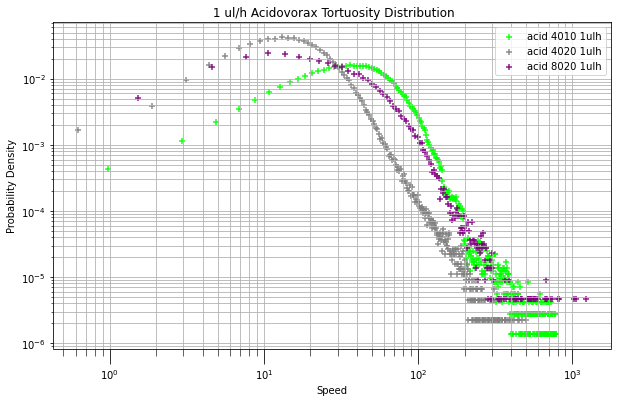

In [9]:
#Plot speed distributions
#tort_acid_4010_1ulh=tort_array
#pd.DataFrame(tort_acid_4010_1ulh).to_csv('C:/Users/marcb/Desktop/flow_trajectories/acidovorax/GS40PL10Z20/trackmate_bgs/tort_001_1ulh.csv')

nbins1 = 400
#micron_velocity = micron_velocity[~np.isnan(micron_velocity)]
#vel2_5_4020.val =vel2_5_4020.val[~np.isnan(vel2_5_4020.val)]

# mean1=(np.nanmean(vel3.val))
# mean2=(np.nanmean(vel2_5.val))

# #tp_norm_vel1_4010=micron_velocity/82.619
# v5_8020=vel1_5_8020.dropna().val/82.619
# v1_8020=vel1_8020.dropna().val/16.428

#v5_4010=v_all5.val/82.619
#v1_4010=v_all1.val/16.428

nbins2=400
n1, bins1 = np.histogram((acid_vel_4010_1ulh.dropna().val), nbins2, density=1)
pdfx5 = np.zeros(n1.size)
pdfy5 = np.zeros(n1.size)
for k in range(n1.size):
    pdfx5[k] = 0.5*(bins1[k]+bins1[k+1])
    pdfy5[k] = n1[k]
plt.scatter(pdfx5,pdfy5,marker='+',c='lime',alpha=.9)
x_axis = np.arange(1e-6, 300, 0.001)

n2, bins2 = np.histogram((acid_vel_4020_1ulh.dropna().val), nbins1, density=1)
pdfx1 = np.zeros(n2.size)
pdfy1 = np.zeros(n2.size)
for k in range(n2.size):
    pdfx1[k] = 0.5*(bins2[k]+bins2[k+1])
    pdfy1[k] = n2[k]
plt.scatter(pdfx1, pdfy1,c='grey', marker='+',alpha=.9)

n2, bins2 = np.histogram((acid_vel_8020_1ulh.dropna().val), nbins1, density=1)
pdfx1 = np.zeros(n2.size)
pdfy1 = np.zeros(n2.size)
for k in range(n2.size):
    pdfx1[k] = 0.5*(bins2[k]+bins2[k+1])
    pdfy1[k] = n2[k]
plt.scatter(pdfx1, pdfy1,c='purple', marker='+',alpha=.9)

#v5_4020=vel2_5_4020.dropna().val/58.124
# n3, bins3 = np.histogram((acid_vel_4010_1ulh.dropna().val), nbins2, density=1)
# pdfx5_4020 = np.zeros(n3.size)
# pdfy5_4020 = np.zeros(n3.size)
# for k in range(n3.size):
#     pdfx5_4020[k] = 0.5*(bins3[k]+bins3[k+1])
#     pdfy5_4020[k] = n3[k]
# plt.scatter(pdfx5_4020,pdfy5_4020,marker='+',c='lightgreen',alpha=.9)

# n2, bins2 = np.histogram((acid_vel1_8020_1ulh.dropna().val/16.428), nbins1, density=1)
# pdfx1 = np.zeros(n2.size)
# pdfy1 = np.zeros(n2.size)
# for k in range(n2.size):
#     pdfx1[k] = 0.5*(bins2[k]+bins2[k+1])
#     pdfy1[k] = n2[k]
# plt.scatter(pdfx1, pdfy1,c='purple', marker='+',alpha=.9)

# n3, bins3 = np.histogram((geo_vel1_4010_5ulh.dropna().val), nbins2, density=1)
# pdfx5_4020 = np.zeros(n3.size)
# pdfy5_4020 = np.zeros(n3.size)
# for k in range(n3.size):
#     pdfx5_4020[k] = 0.5*(bins3[k]+bins3[k+1])
#     pdfy5_4020[k] = n3[k]
# plt.scatter(pdfx5_4020,pdfy5_4020,marker='+',c='indigo',alpha=.9)

#acid_vel1_4020_5ulh.dropna().val/58.124
# v1_4020=vel3_4020.val/11.558
# n4, bins4 = np.histogram((v1_4020), nbins2, density=1)
# pdfx_4020 = np.zeros(n4.size)
# pdfy_4020 = np.zeros(n4.size)
# for k in range(n4.size):
#     pdfx_4020[k] = 0.5*(bins4[k]+bins4[k+1])
#     pdfy_4020[k] = n4[k]
#plt.scatter(pdfx_4020,pdfy_4020,marker='+',c='darkgoldenrod',alpha=.9)


import matplotlib as mpl

#plt.plot(pdfx, pdfy)
#plt.ylim(1e-6,.1)
#plt.xlim(1,10)
plt.xscale('log')
plt.yscale('log')
plt.title(' 1 ul/h Acidovorax Tortuosity Distribution')
plt.xlabel('Speed')
plt.ylabel('Probability Density')
plt.grid(True)
#plt.plot(x_axis, pdf5_vel, c='blue',linewidth=6)
#plt.plot(x_axis, pdf1_vel,c='darkblue',linewidth=6)
#plt.plot(x_axis, pdf5_vel4020, c='gold',linewidth=6)
#plt.plot(x_axis, pdf1_vel4020,c='darkgoldenrod',linewidth=6)
plt.legend(['acid 4010 1ulh', 'acid 4020 1ulh', 'acid 8020 1ulh'])
#plt.rc('xtick', labelsize=10) 

#plt.tick_params(axis='both', which='minor', labelsize=22)
mpl.rcParams['xtick.major.size'] = 15
mpl.rcParams['xtick.minor.size'] = 7
plt.grid(b=True, which='minor')
#print (np.nanmean(tort_acid_4010_5ulh),np.nanmean(tort_acid_4020_5ulh),np.nanmean(tort_acid_8020_5ulh))

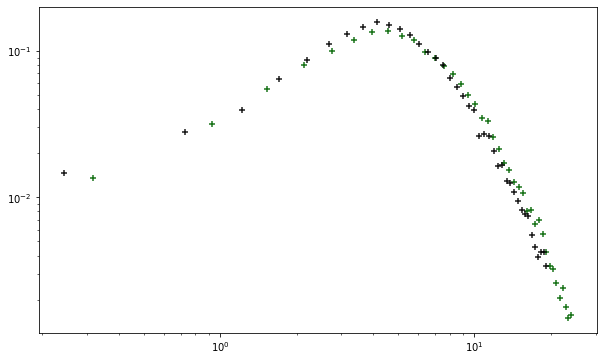

In [73]:
#Old speed distributions with line of best fit

#pdfx5_4020[7:12]
#np.mean(pdfx5_4020[1:10])
#xlog=np.geomspace(pdfx_4020[10],pdfx_4020[-2])
#ylog=np.geomspace(pdfy_4020[10],pdfy_4020[-2])
#plt.scatter(xlog,ylog)
#plt.xscale('log')
#plt.yscale('log')
#plt.xlim(1e-1,1e1)
#plt.ylim(1e-3,1)(pdfx5_4020>=.08)&(pdfx5_4020<=.2)
micron_velocity = micron_velocity[~np.isnan(micron_velocity)]
# tmate_acid8020_5ulh_001_vel=micron_velocity
# tmate_acid8020_5ulh_001_angle=angle_array
nbins2=40
# n1, bins1 = np.histogram((tp_acid8020_5ulh_001_vel), nbins2, density=1)
# pdfx5 = np.zeros(n1.size)
# pdfy5 = np.zeros(n1.size)
# for k in range(n1.size):
#     pdfx5[k] = 0.5*(bins1[k]+bins1[k+1])
#     pdfy5[k] = n1[k]
# plt.scatter(pdfx5,pdfy5,marker='+',c='lime',alpha=.9)
# x_axis = np.arange(1e-6, 300, 0.001)

n2, bins2 = np.histogram((micron_velocity), nbins2, density=1)
pdfx1 = np.zeros(n2.size)
pdfy1 = np.zeros(n2.size)
for k in range(n2.size):
    pdfx1[k] = 0.5*(bins2[k]+bins2[k+1])
    pdfy1[k] = n2[k]
plt.scatter(pdfx1, pdfy1,c='darkgreen', marker='+',alpha=.9)

#v5_4020=vel2_5_4020.dropna().val/58.124
n3, bins3 = np.histogram((tmate_acid8020_5ulh_001_vel), nbins2, density=1)
pdfx5_4020 = np.zeros(n3.size)
pdfy5_4020 = np.zeros(n3.size)
for k in range(n3.size):
    pdfx5_4020[k] = 0.5*(bins3[k]+bins3[k+1])
    pdfy5_4020[k] = n3[k]
plt.scatter(pdfx5_4020,pdfy5_4020,marker='+',c='black',alpha=.9)

# v1_4020=vel3_4020.val/11.558
# n4, bins4 = np.histogram((v1_4020), nbins2, density=1)
# pdfx_4020 = np.zeros(n4.size)
# pdfy_4020 = np.zeros(n4.size)
# for k in range(n4.size):
#     pdfx_4020[k] = 0.5*(bins4[k]+bins4[k+1])
#     pdfy_4020[k] = n4[k]
# plt.scatter(pdfx_4020,pdfy_4020,marker='+',c='black',alpha=.9)
# plt.rc('axes', titlesize=30,labelsize=40)
# plt.ylim(1e-4,1)
# plt.xlim(5e-2,10)
plt.xscale('log')
plt.yscale('log')
# plt.title('Normalized Velocity Distribution')
# plt.xlabel('Normalized Velocity')
# plt.ylabel('Probability Density')
# plt.plot(x_axis, pdf5_vel4010, c='lime',linewidth=6,linestyle='--')
# plt.plot(x_axis, pdf1_vel4010,c='darkgreen',linewidth=6)
# plt.plot(x_axis, pdf5_vel4020, c='grey',linewidth=6,linestyle='--')
# plt.plot(x_axis, pdf1_vel4020,c='black',linewidth=6)
# plt.legend(['5 ul/h 4010', '1 ul/h 4010', '5 ul/h 4020', '1 ul/h 4020'])


Text(0, 0.5, 'Probability')

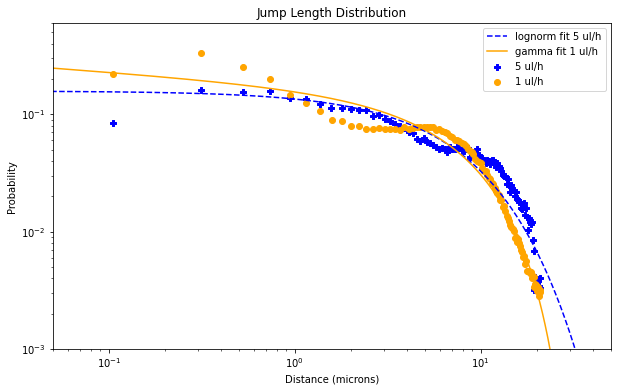

In [1038]:
#Jump length distributions (no longer used)

plt.plot(x_axis, pdf5_dist,c='blue',linestyle='dashed')
plt.plot(x_axis, pdf1_dist, c='orange')
nbins1 = 100
mean1=(np.nanmean(dist3.val))
mean2=(np.nanmean(dist2_5.val))


nbins2=100
n, bins = np.histogram(dist_all5.val, nbins2, density=True)
pdfx5 = np.zeros(n.size)
pdfy5 = np.zeros(n.size)
for k in range(n.size):
    pdfx5[k] = 0.5*(bins[k]+bins[k+1])
    pdfy5[k] = n[k]

plt.scatter(pdfx5, pdfy5,marker='P',c='blue')

micron_dist_array = micron_dist_array[~np.isnan(micron_dist_array)]
n, bins = np.histogram(dist_all1.val, nbins1, density=True)
pdfx1 = np.zeros(n.size)
pdfy1 = np.zeros(n.size)
for k in range(n.size):
    pdfx1[k] = 0.5*(bins[k]+bins[k+1])
    pdfy1[k] = n[k]

plt.scatter(pdfx1, pdfy1,c='orange')



plt.xlim(.05,50)
plt.ylim(1e-3,.6)
plt.xscale('log')
plt.yscale('log')

plt.title('Jump Length Distribution')
plt.xlabel('Distance (microns)')
plt.legend(['lognorm fit 5 ul/h', 'gamma fit 1 ul/h', '5 ul/h', '1 ul/h'])

plt.ylabel('Probability')



,index,val
0,NaN,0.000000
1,0.0,1.000000
2,1.0,-0.199125
3,2.0,-0.149425
4,3.0,-0.095045
...,...,...
7,6.0,-0.037847
8,7.0,-0.031983
9,8.0,-0.030731
10,9.0,-0.029415


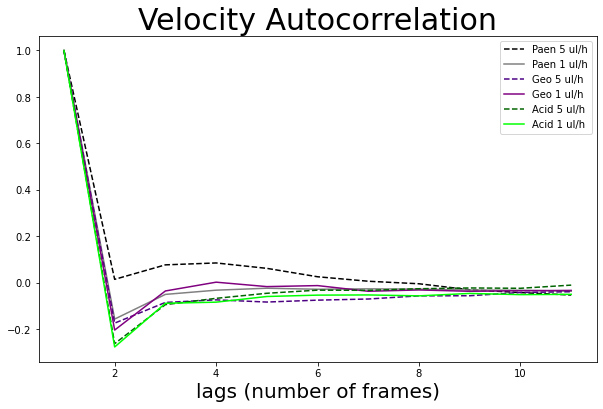

In [91]:
#Plot velocity autocorrelations

vc_paen_average1=(paen_vc1_8020_1ulh.dropna()+paen_vc2_8020_1ulh.dropna()+paen_vc2_8020_1ulh.dropna())/3
vc_paen_average5=(paen_vc1_8020_5ulh.dropna()+paen_vc2_8020_5ulh.dropna()+paen_vc2_8020_5ulh.dropna())/3
plt.plot(vc_paen_average5.val, linestyle='--', c='black')
plt.plot(vc_paen_average1.val, c='grey')
vc_geo_average1=(geo_vc1_8020_1ulh.dropna()+geo_vc2_8020_1ulh.dropna()+geo_vc2_8020_1ulh.dropna())/3
vc_geo_average5=(geo_vc1_8020_5ulh.dropna()+geo_vc2_8020_5ulh.dropna()+geo_vc2_8020_5ulh.dropna())/3
plt.plot(vc_geo_average5.val, linestyle='--', c='indigo')
plt.plot(vc_geo_average1.val, c='purple')
#vc_acid_average1=(acid_vc1_8020_1ulh.dropna()+acid_vc2_8020_1ulh.dropna()+acid_vc2_8020_1ulh.dropna())/3
#vc_acid_average5=(acid_vc1_8020_5ulh.dropna()+acid_vc2_8020_5ulh.dropna()+acid_vc2_8020_5ulh.dropna())/3
plt.plot(acid_vc1_8020_1ulh.dropna().val, linestyle='--', c='darkgreen')
plt.plot(acid_vc1_8020_5ulh.dropna().val, c='lime')

plt.title('Velocity Autocorrelation')
plt.xlabel('lags (number of frames)')
plt.legend(['Paen 5 ul/h', 'Paen 1 ul/h', 'Geo 5 ul/h', 'Geo 1 ul/h', 'Acid 5 ul/h', 'Acid 1 ul/h'])
vc1

In [68]:
paen_ang_8020_5ulh.dropna().val[np.abs(paen_ang_8020_5ulh.val)>0]

1          0.00000
2          0.00000
3          0.00000
4          0.00000
5          0.00000
            ...   
175419    10.14994
175420     0.00000
175421     0.00000
175422     0.00000
175423     0.00000
Name: val, Length: 844223, dtype: float64

Text(0, 0.5, 'Probability Density')

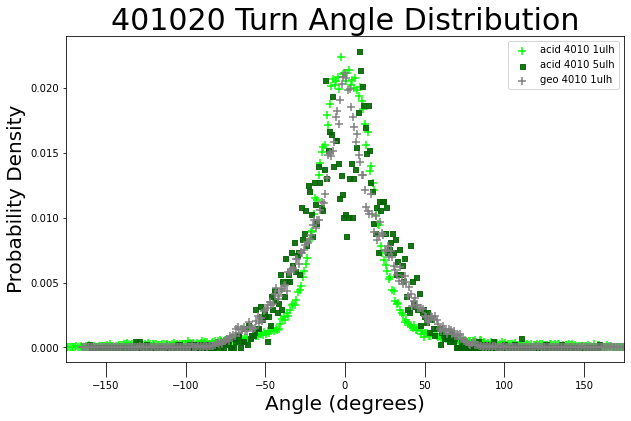

In [133]:
#Plot turn angle distribution

nbins = 360
# ang5_8020=ang1_5_8020.dropna().val
# ang1_8020=ang1_8020

# ang5_4020=ang2_5_4020.dropna().val
# ang1_4020=ang3_4020.dropna().val

# ang5_4010=ang_all5.dropna().val
# ang1_4010=ang_all1.dropna().val

#angle_array = angle_array[~np.isnan(angle_array)]


n, bins = np.histogram(geo_ang2_8020_5ulh.dropna().val[np.abs(geo_ang2_8020_5ulh.dropna().val)>0], nbins, density=1)
pdfx5 = np.zeros(n.size)
pdfy5 = np.zeros(n.size)
for k in range(n.size):
    pdfx5[k] = 0.5*(bins[k]+bins[k+1])
    pdfy5[k] = n[k]

n, bins = np.histogram(geo_8020_5ulh_ang_fast[np.abs(geo_8020_5ulh_ang_fast)>0], nbins, density=1)
pdfx_a = np.zeros(n.size)
pdfy_a = np.zeros(n.size)
for k in range(n.size):
    pdfx_a[k] = 0.5*(bins[k]+bins[k+1])
    pdfy_a[k] = n[k]

n, bins = np.histogram(geo_8020_5ulh_ang_slow[np.abs(geo_8020_5ulh_ang_slow)>0], nbins, density=1)
pdfx5_a = np.zeros(n.size)
pdfy5_a = np.zeros(n.size)
for k in range(n.size):
    pdfx5_a[k] = 0.5*(bins[k]+bins[k+1])
    pdfy5_a[k] = n[k]

# n, bins = np.histogram(geo_ang1_4010_5ulh.dropna().val[np.abs(geo_ang1_4010_5ulh.val)>0], nbins, density=1)
# pdfx = np.zeros(n.size)
# pdfy = np.zeros(n.size)
# for k in range(n.size):
#     pdfx[k] = 0.5*(bins[k]+bins[k+1])
#     pdfy[k] = n[k]

# n, bins = np.histogram(acid_ang1_4010_1ulh.dropna().val, nbins, density=1)
# pdfx_b = np.zeros(n.size)
# pdfy_b = np.zeros(n.size)
# for k in range(n.size):
#     pdfx_b[k] = 0.5*(bins[k]+bins[k+1])
#     pdfy_b[k] = n[k]
    
# n, bins = np.histogram(acid_ang1_4010_5ulh.dropna().val, nbins, density=1)
# pdfx5_b = np.zeros(n.size)
# pdfy5_b = np.zeros(n.size)
# for k in range(n.size):
#     pdfx5_b[k] = 0.5*(bins[k]+bins[k+1])
#     pdfy5_b[k] = n[k]


plt.rc('axes', titlesize=30,labelsize=20)    
plt.scatter(pdfx5, pdfy5, marker='+', c='lime',alpha=1,s=75)
plt.scatter(pdfx_a, pdfy_a, c='darkgreen',marker='s',alpha=.9,s=25)
plt.scatter(pdfx5_a, pdfy5_a, marker='+', c='grey',s=75)
# plt.scatter(pdfx, pdfy, c='black',alpha=.9,marker='s',s=25)


# plt.scatter(pdfx5_b, pdfy5_b, marker='+', c='indigo',s=75)
# plt.scatter(pdfx_b, pdfy_b, c='purple',marker='s',alpha=.9,s=25)

#plt.ylim(0,.025)
plt.xlim(-175,175)
plt.title('401020 Turn Angle Distribution')
plt.legend(['acid 4010 1ulh', 'acid 4010 5ulh', 'geo 4010 1ulh', 'geo 4010 5ulh','Acid 5 ul/h 8020', 'Acid 1 ul/h 8020'])
plt.xlabel('Angle (degrees)')
plt.ylabel('Probability Density')


In [27]:
#Read in times for emsd calculation
time1=pd.read_excel('D:\Acidovorax\GS40PL20Z20\FR_1ulh_20X_25fps_1x1y_5min_001.xlsx').drop(range(405))
time2=pd.read_excel('D:\Acidovorax\GS40PL20Z20\FR_1ulh_20X_25fps_1x1y_5min_002.xlsx').drop(range(405))
time3=pd.read_excel('D:\Acidovorax\GS40PL20Z20\FR_1ulh_20X_25fps_1x1y_5min_003.xlsx').drop(range(405))

time1_5=pd.read_excel('D:\Acidovorax\GS40PL20Z20\FR_5ulh_20X_25fps_1x1y_5min_001.xlsx').drop(range(405))
time2_5=pd.read_excel('D:\Acidovorax\GS40PL20Z20\FR_5ulh_20X_25fps_1x1y_5min_002.xlsx').drop(range(405))
fps1=1/((np.mean(time1['Time [s]'].diff())+np.mean(time2['Time [s]'].diff())+np.mean(time3['Time [s]'].diff()))/3)
fps5=1/((np.mean(time2_5['Time [s]'].diff())))#+np.mean(time2_5['Time [s]'].diff()))/2)
print (fps1, fps5)

8.551638604870078 8.950065185095353


In [725]:
#em 1 corresponds to all the trajectories for 1ulh for a given geometry. Loop through each set of trajectories from the same geometry and calculate the MSD for each one, the average the values
em1=[]
em5=[]
t_all1=[t1,t2,t3]
t_all5=[t2_5]
for i in t_all1:
    em1.append(tp.emsd(i, .35, fps1, max_lagtime=300))
em_all_val1=(em1[0].values+em1[1].values+em1[2].values)/3
#em_all_val=(em[0].values+em[1].values)/2

em_index1=em1[0].index
em_all1=pd.DataFrame(em_all_val1,index=em_index1,columns=['msd'])

for i in t_all5:
    em5.append(tp.emsd(i, .35, fps5,max_lagtime=300))
#em_all_val5=(em5[0].values+em5[1].values+em5[2].values)/3
em_all_val5=(em5[0].values+em5[1].values)/2

em_index5=em5[0].index
em_all5=pd.DataFrame(em_all_val5,index=em_index5,columns=['msd'])

IndexError: list index out of range

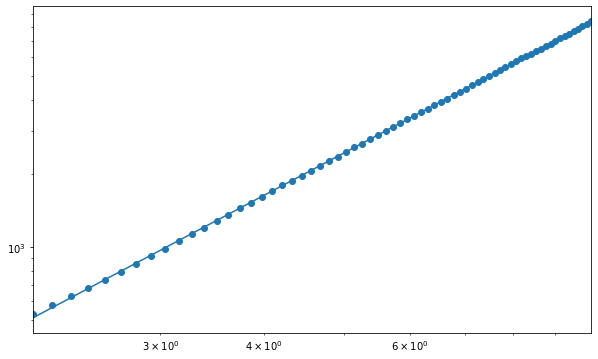

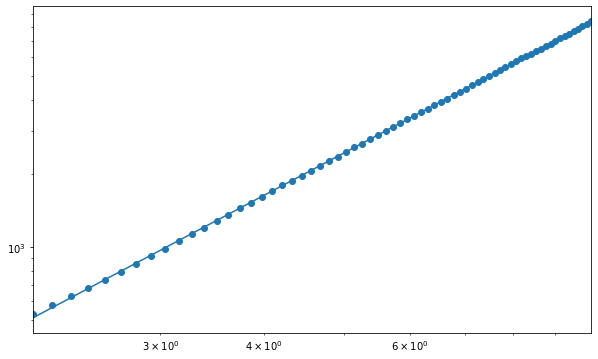

134.64291534440642 1.7971673819584555


In [727]:
#Compute intercept and slope. You can use the first or second set of lines to calculate intercept and slope.

#intercept=(tp.utils.fit_powerlaw(em[0]).values[0][1]+tp.utils.fit_powerlaw(em[1]).values[0][1]+tp.utils.fit_powerlaw(em[2]).values[0][1])/3
#slope=(tp.utils.fit_powerlaw(em[0]).values[0][0]+tp.utils.fit_powerlaw(em[1]).values[0][0]+tp.utils.fit_powerlaw(em[2]).values[0][0])/3

intercept=tp.utils.fit_powerlaw(em_all1[2:10].msd).values[0][1]
slope=tp.utils.fit_powerlaw(em_all1[2:10].msd).values[0][0]

print (intercept,slope)
x=np.linspace(np.min(em1[0].index),np.max(em1[0].index))
y=intercept*x**slope
y_linear=intercept*x

#intercept=tp.utils.fit_powerlaw(em_all1).values[0][1]
#slope=tp.utils.fit_powerlaw(em_all1).values[0][0]
#print (intercept,slope)
#x=np.linspace(np.min(em1.index),np.max(em1.index))
#y=intercept*x**slope
#y_linear=intercept*x


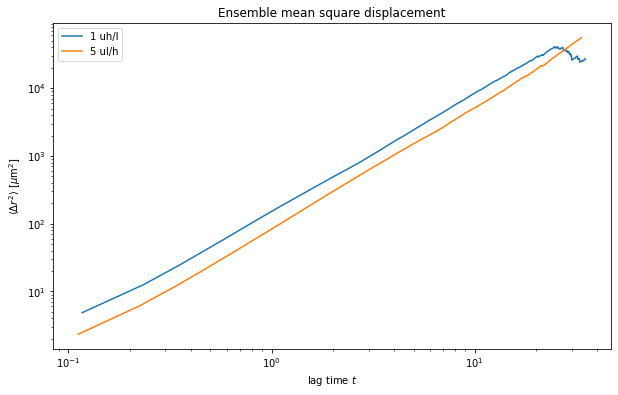

In [745]:
#Plot the emsd for all 5ulh and 1ulh videos for a geometry
#plt.figure()
plt.ylabel(r'$\langle \Delta r^2 \rangle$ [$\mu$m$^2$]')
plt.xlabel('lag time $t$');

plt.title('Ensemble mean square displacement')
#plt.plot(tp.utils.fit_powerlaw(em))
plt.xscale('log')
plt.yscale('log')
plt.plot(em_all1)
plt.plot(em_all5)

#plt.plot(x,.5*y_linear)
#plt.plot(x[-45:-40]+1,y[-45:-40]-20)
plt.legend(['1 uh/l','5 ul/h'])#) f'y=at^k~{slope:.4f}'] )


In [ ]:
#Calculate slopes of different videos individually
#intercept1=tp.utils.fit_powerlaw(em_all1[0:1].msd).values[0][1]
slope1=tp.utils.fit_powerlaw(em_all1[0:1].msd).values[0][0]
slope2=tp.utils.fit_powerlaw(em_all1[1:10].msd).values[0][0]
slope3=tp.utils.fit_powerlaw(em_all1[10:].msd).values[0][0]

slope1_5=tp.utils.fit_powerlaw(em_all5[0:2].msd).values[0][0]
slope2_5=tp.utils.fit_powerlaw(em_all5[2:10].msd).values[0][0]
slope3_5=tp.utils.fit_powerlaw(em_all5[10:].msd).values[0][0]
print (slope1, slope2, slope3, slope1_5, slope2_5, slope3_5)
em_all5[0:1]